# Data Visualization

Visualization of some of the data for reporting in paper. We will compare two classes for visualization: metal and classical. 

Sources:

* https://www.kdnuggets.com/2020/02/audio-data-analysis-deep-learning-python-part-1.html

### Read in and play song data

In [12]:
import librosa
import librosa.display
import IPython.display as ipd

import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
data_path = 'C:/Users/mplat/CS-6140-ML/project/data/'

In [5]:
# import song files
metal_1_path = data_path + 'metal/std_006c145cea29e3c93ab331c882d82f97.mp3'
metal_2_path = data_path + 'metal/std_00302ad2489630819f64a2c35aa9729d.mp3'
metal_3_path = data_path + 'metal/std_0058505adce0279aaf5a6f528aebc516.mp3'

classical_1_path = data_path + 'classical/std_297c587b030783b67f5e682afea1b0ba.mp3'
classical_2_path = data_path + 'classical/std_2161b51d2affd5edac93102210180964.mp3'
classical_3_path = data_path + 'classical/std_3869ddcf2fea661146a1bef9a6c68dfd.mp3'

In [13]:
# load file with librosa
# returns a audio time series as a numpy array with a default sampling rate(sr) of 22KHZ mono
x_metal_1 , sr_metal_1 = librosa.load(metal_1_path)
x_metal_2 , sr_metal_2 = librosa.load(metal_2_path)
x_metal_3 , sr_metal_3 = librosa.load(metal_3_path)

x_classical_1 , sr_classical_1 = librosa.load(classical_1_path)
x_classical_2 , sr_classical_2 = librosa.load(classical_2_path)
x_classical_3 , sr_classical_3 = librosa.load(classical_3_path)

In [7]:
# play songs in Jupyter notebook

ipd.Audio(metal_1_path)

In [8]:
ipd.Audio(classical_1_path)

### Plotting wave amplitude for raw songs

Text(0.5, 1.0, 'Classical 3')

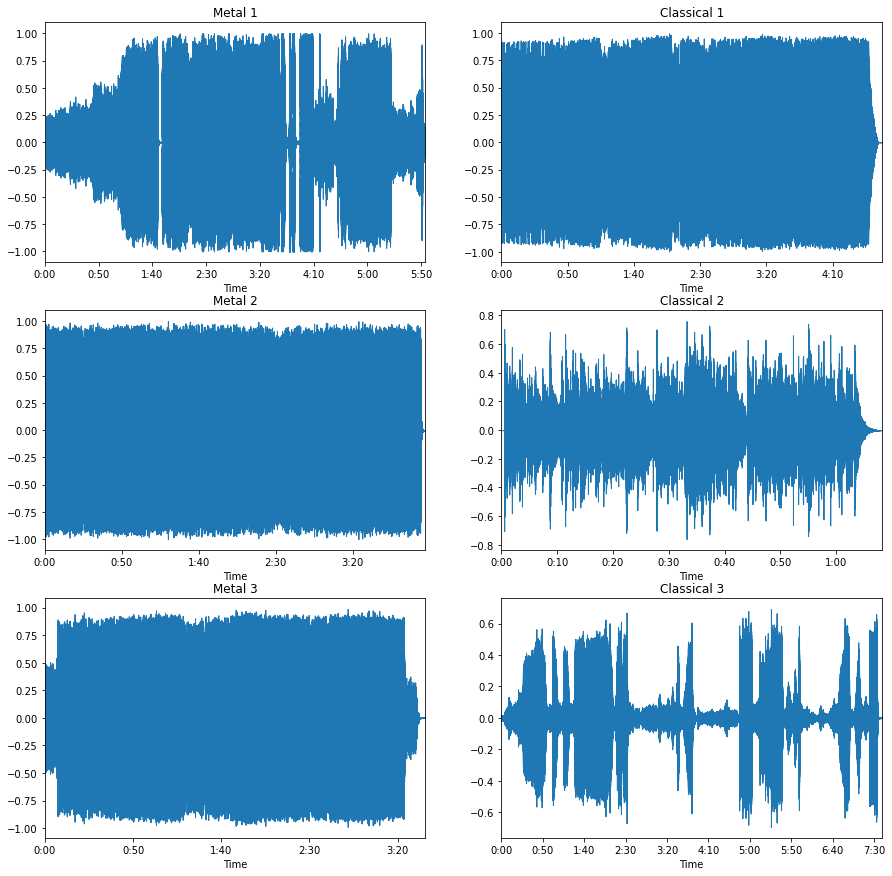

In [23]:
# plot the wave amplitude for each song

fig, axs = plt.subplots(3, 2, figsize=(15,15))

librosa.display.waveplot(x_metal_1, sr=sr_metal_1, ax=axs[0, 0])
axs[0, 0].set_title('Metal 1')

librosa.display.waveplot(x_metal_2, sr=sr_metal_2, ax=axs[1, 0])
axs[1, 0].set_title('Metal 2')

librosa.display.waveplot(x_metal_3, sr=sr_metal_3, ax=axs[2, 0])
axs[2, 0].set_title('Metal 3')

librosa.display.waveplot(x_classical_1, sr=sr_classical_1, ax=axs[0, 1])
axs[0, 1].set_title('Classical 1')

librosa.display.waveplot(x_classical_2, sr=sr_classical_2, ax=axs[1, 1])
axs[1, 1].set_title('Classical 2')

librosa.display.waveplot(x_classical_3, sr=sr_classical_3, ax=axs[2, 1])
axs[2, 1].set_title('Classical 3')

There are differences between songs, but not clear differences between genre, so we will need to extract features that can be used to distinguish genre. 

### Plotting spectrograms. 

Spectrograms, in addition to wave amplitude, is another way to visualize songs. Spectrograms show the song's the signal strength over time.

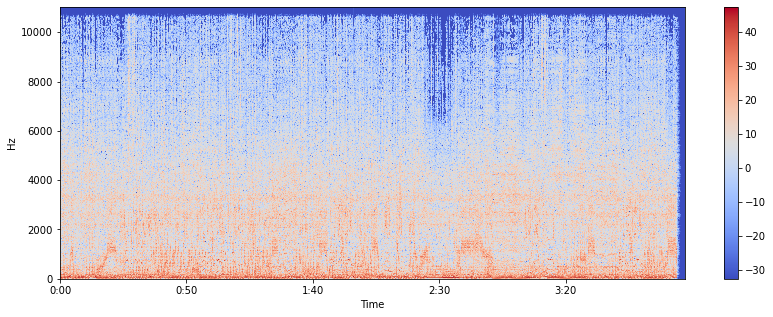

In [25]:
X_metal_2 = librosa.stft(x_metal_2)
Xdb_metal_2 = librosa.amplitude_to_db(abs(X_metal_2))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb_metal_2, sr=sr_metal_2, x_axis='time', y_axis='hz')
plt.colorbar()

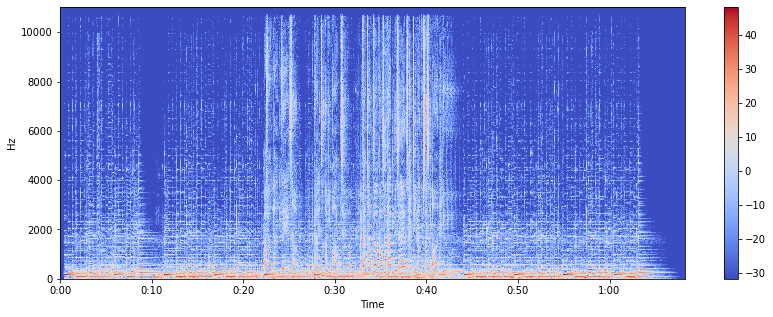

In [26]:
X_classical_2 = librosa.stft(x_classical_2)
Xdb_classical_2 = librosa.amplitude_to_db(abs(X_classical_2))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb_classical_2, sr=sr_classical_2, x_axis='time', y_axis='hz')
plt.colorbar()

We can see above that the metal song (in this case) is much louder. Still, this doesn't mean that all classical songs will be less loud than metal songs.

### Plotting Mel-Frequency Cepstral Coefficients (MFCCs)

We will use mfccs as features in this project, as they are commonly used in the literature for music classification (or general audio classification). Mfccs are a set of features that represent the overall shape of a spectral envelope.

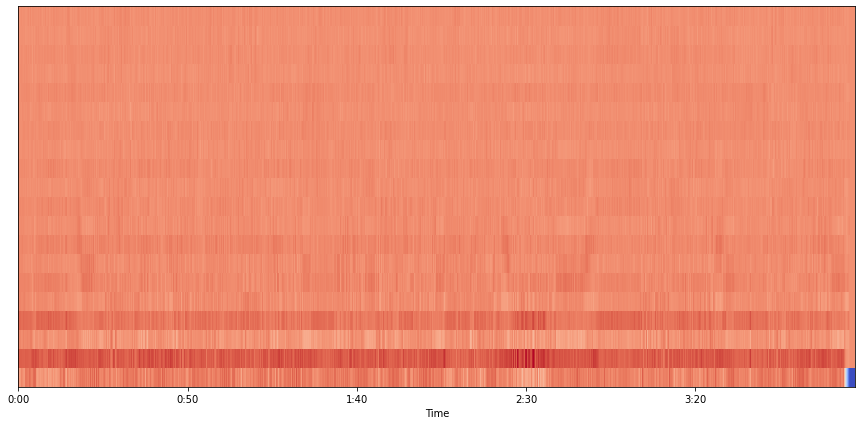

In [31]:
mfcc = librosa.feature.mfcc(x_metal_2, sr=sr_metal_2)
plt.figure(figsize=(15, 7))
librosa.display.specshow(mfcc, sr=sr_metal_2, x_axis='time')

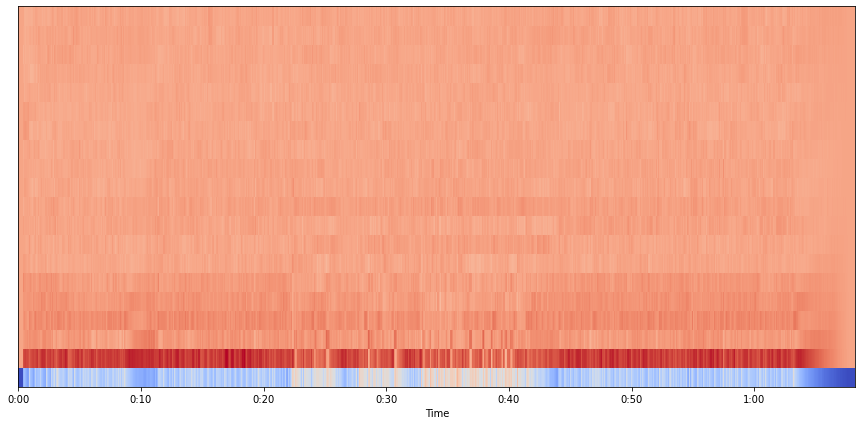

In [32]:
mfcc = librosa.feature.mfcc(x_classical_2, sr=sr_classical_2)
plt.figure(figsize=(15, 7))
librosa.display.specshow(mfcc, sr=sr_classical_2, x_axis='time')